In [1]:
import optical_gating_analysis as OG
import matplotlib.pyplot as plt
import numpy as np
import j_py_sad_correlation as jps

In [23]:
data_src = r"E:\2024-04-05 12.48.21 vid no water\Allied Vision Technologies GS650 0001f61c\*tif"

data = OG.SequenceManager.load_tif(data_src)

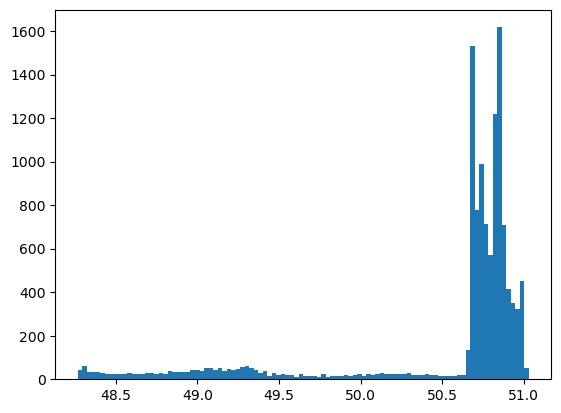

In [24]:
plt.hist(np.mean(data, axis=(1,2)), bins = 100)
plt.show()

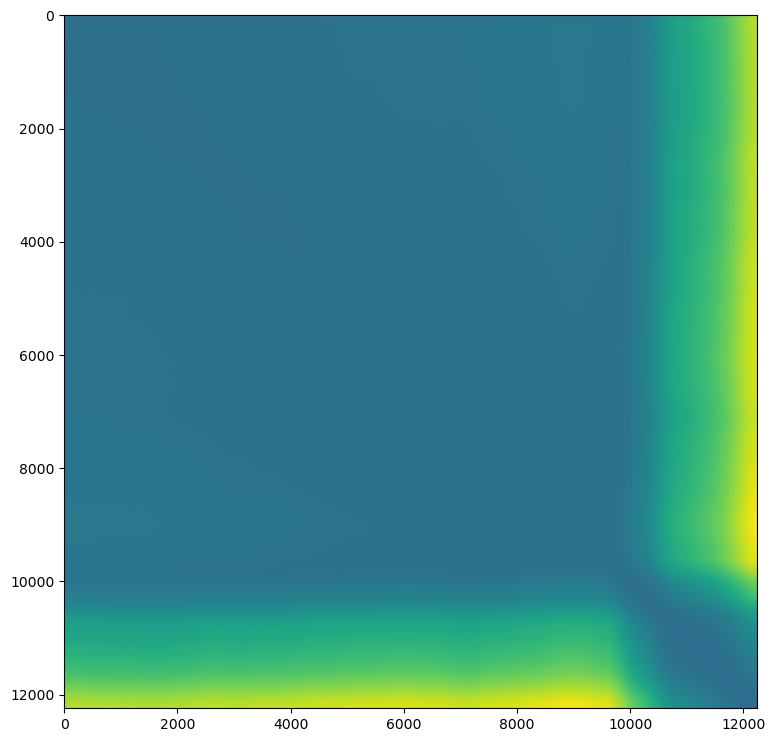

In [25]:
sads = []
for i in range(data.shape[0]):
    sads.append(jps.sad_with_references(data[i], data))

plt.figure(figsize = (16,9))
plt.imshow(sads)
plt.show()

In [26]:
sads = np.array(sads)

In [27]:
sads = sads[~np.eye(sads.shape[0],dtype=bool)].reshape(sads.shape[0],-1)

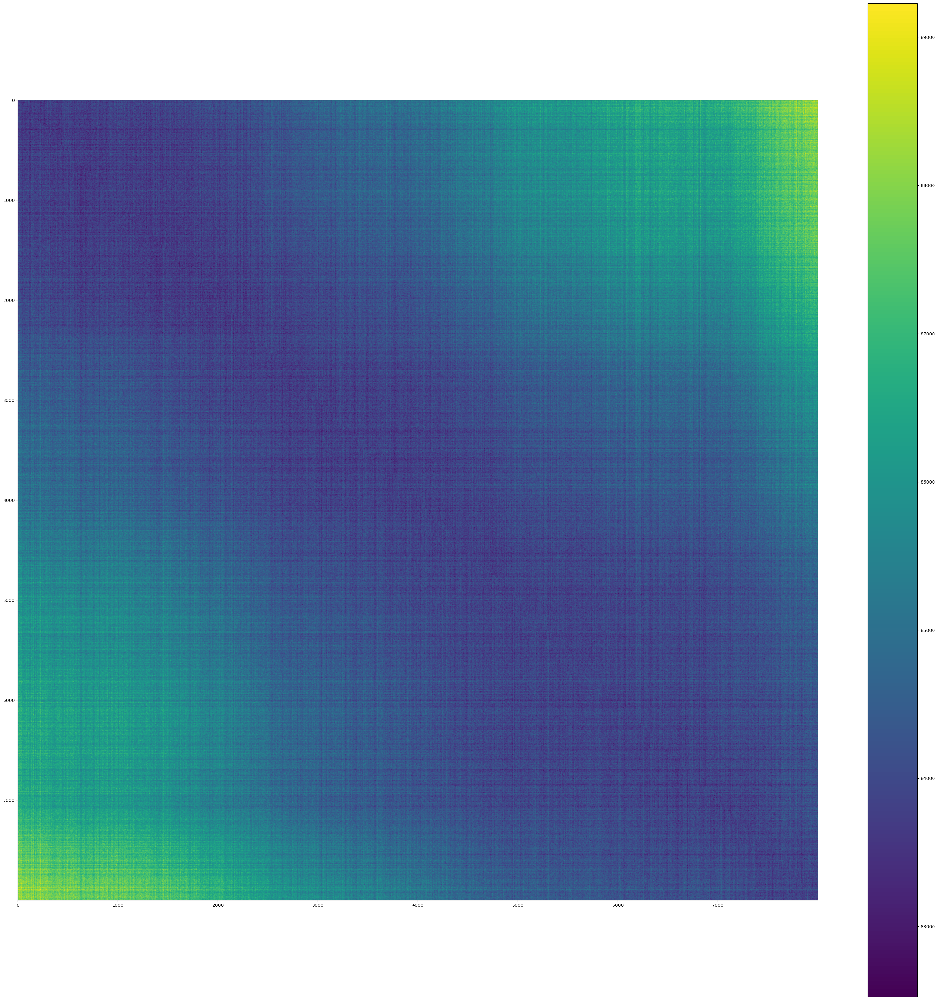

In [29]:
plt.figure(figsize = (40,40))
plt.imshow(sads[0:8000,0:8000], interpolation = 'none')
plt.colorbar()
plt.show()

In [7]:
data_src = r"E:\2024-04-05 17.38.02 vid pre-caffeine 3\Allied Vision Technologies GS650 0001f61c\*tif"

In [8]:
oog = OG.BasicOpticalGating()
oog.sequence_manager.set_source(data_src)
oog.settings["pi_space"] = False
oog.settings["include_reference_frames"] = True
oog.run()
"""oog = OG.BasicOpticalGating()
oog.sequence_manager.set_source(r"D:\Data\2012-06-20 13.34.11 vid 2x2 multi phase single plane\brightfield\*tif")
oog.settings["pi_space"] = False
oog.settings["include_reference_frames"] = True
oog.run()"""

Setting source to E:\2024-04-05 17.38.02 vid pre-caffeine 3\Allied Vision Technologies GS650 0001f61c\*tif
Getting reference sequence
Reference period: 160.0736040609137; Reference indices: [23, 188]
Getting SADs
Getting phases


'oog = OG.BasicOpticalGating()\noog.sequence_manager.set_source(r"D:\\Data\x812-06-20 13.34.11 vid 2x2 multi phase single plane\x08rightfield\\*tif")\noog.settings["pi_space"] = False\noog.settings["include_reference_frames"] = True\noog.run()'

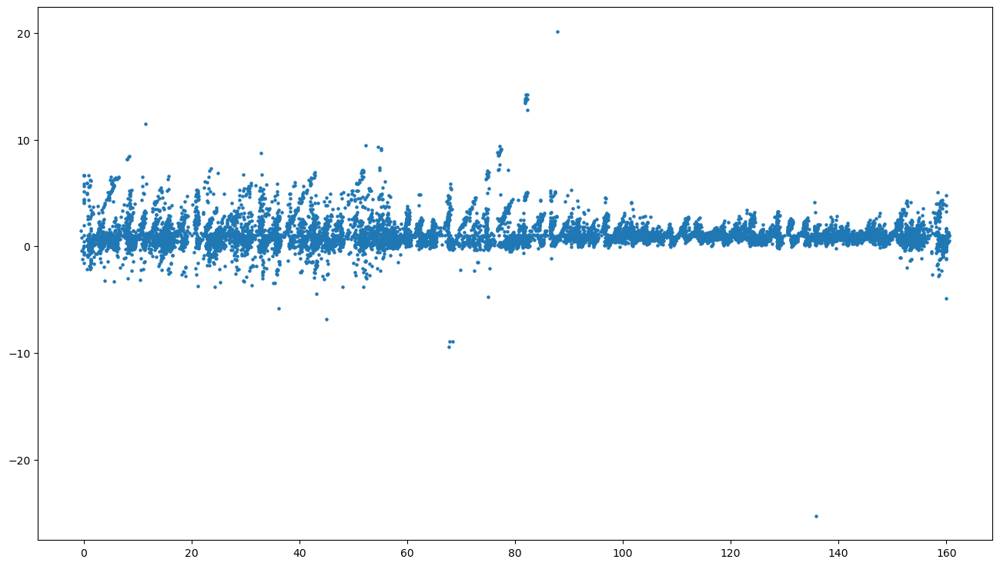

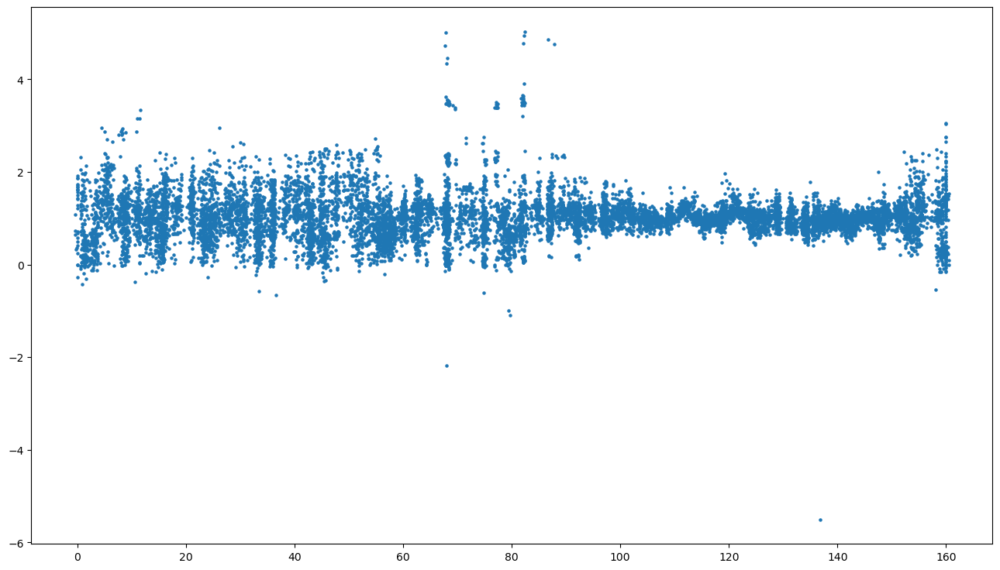

In [9]:
plt.figure(figsize = (16,9))
plt.scatter(oog.phases[1::], oog.delta_phases, s = 5)
plt.show()

window = 4
plt.figure(figsize = (16,9))
plt.scatter(oog.phases[2:-2], np.convolve(oog.delta_phases, np.ones(window)/window, mode='valid'), s = 5)
plt.show()

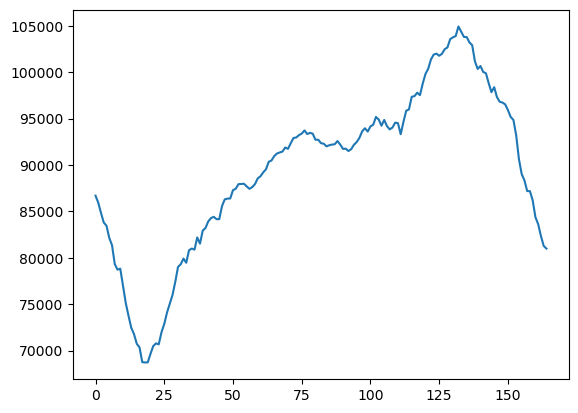

In [19]:
plt.plot(oog.sads[200])

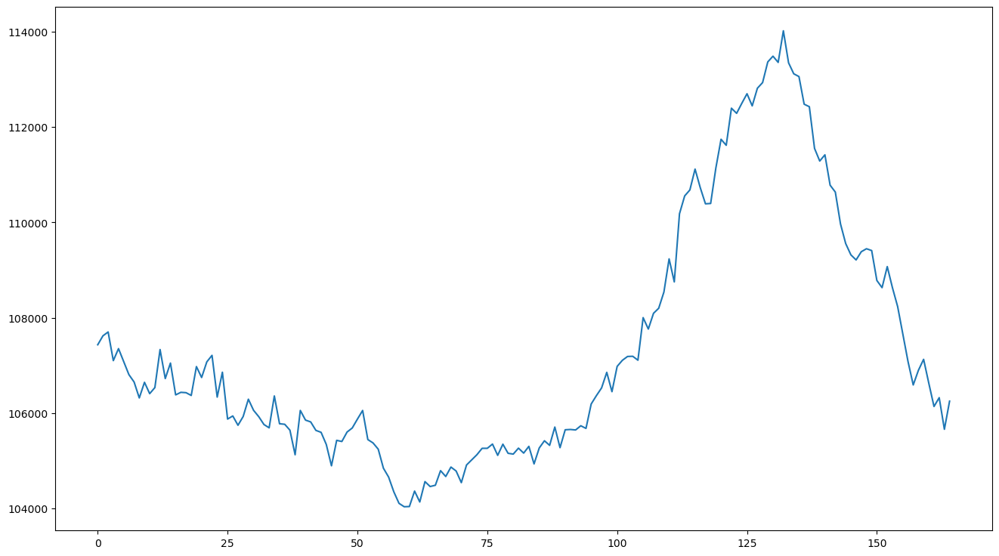

In [11]:
plt.figure(figsize = (16,9))
plt.plot(np.mean(oog.sads, axis = 0))
plt.show()

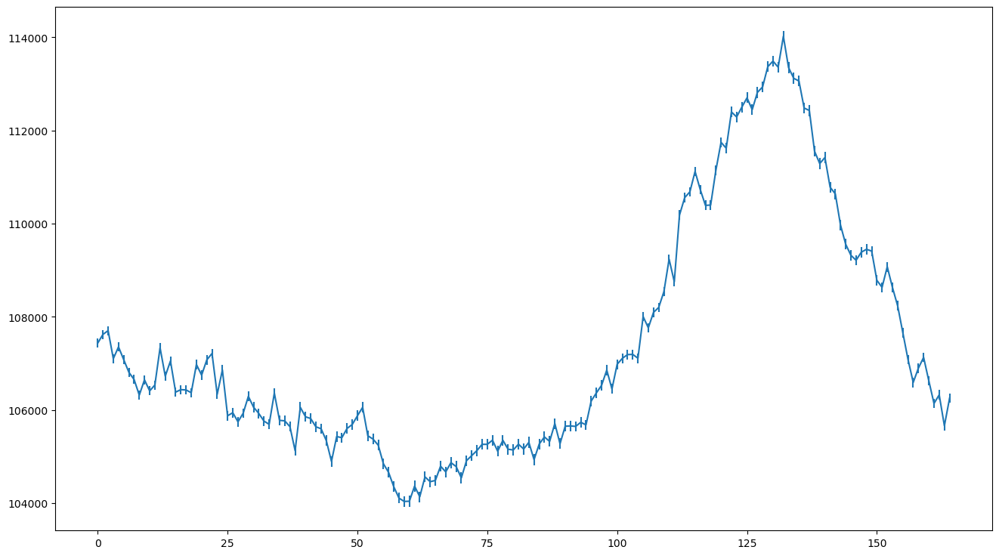

In [12]:
plt.figure(figsize = (16,9))
plt.errorbar(range(np.mean(oog.sads, axis = 0).shape[0]), np.mean(oog.sads, axis = 0), yerr = np.std(oog.sads, axis = 0) / np.sqrt(len(oog.sads)))
plt.show()

In [13]:
print(oog.sequence_manager.reference_indices)

[23, 188]


In [14]:
data = OG.SequenceManager.load_tif(oog.sequence_manager.sequence_src).astype(np.int64)

31272.58752794265


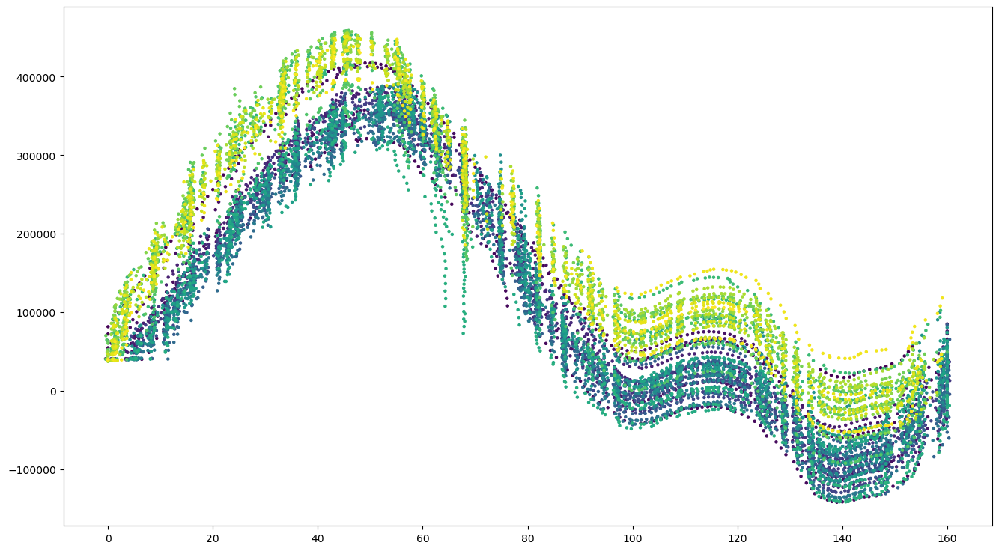

In [15]:
cumsum = 5e8
cumsums = []
frame_diffs = np.sum(np.abs(np.diff(data, axis = 0)), axis = (1,2))
mean = np.mean(frame_diffs)
print(mean)

for i in range(1,data.shape[0] - 1):
    if abs(oog.phases[i] - oog.phases[i-1]) > 60:
        cumsum = mean
    cumsum += frame_diffs[i] - mean
    cumsums.append(cumsum)

plt.figure(figsize = (16,9))
plt.scatter(oog.phases[1::], cumsums, c = range(len(cumsums)),s = 5)

In [16]:
frame_differences = np.sum(np.abs(np.diff(data, axis=0)), axis=(1,2))

KeyboardInterrupt: 

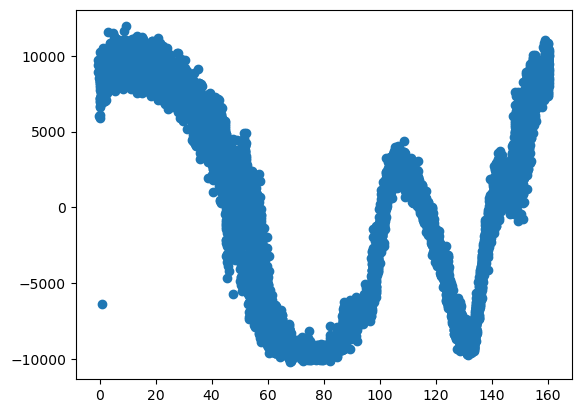

In [ ]:
plt.scatter(oog.phases, frame_differences - np.mean(frame_differences[oog.sequence_manager.reference_indices[0]:oog.sequence_manager.reference_indices[1]]))

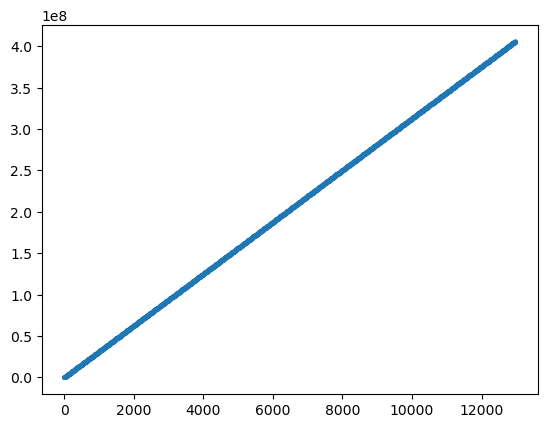

In [ ]:
plt.scatter(range(data.shape[0] - 1), np.cumsum(frame_differences), s = 5)

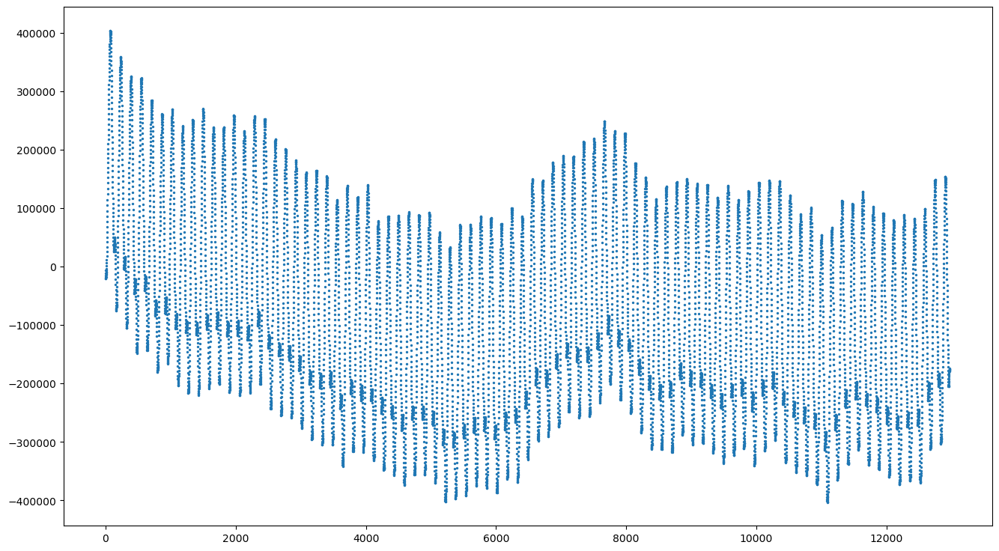

In [ ]:
plt.figure(figsize = (16,9))
plt.scatter(range(data.shape[0] - 1), np.cumsum(frame_differences - np.mean(frame_differences[oog.sequence_manager.reference_indices[0]:oog.sequence_manager.reference_indices[1]])), s = 2)

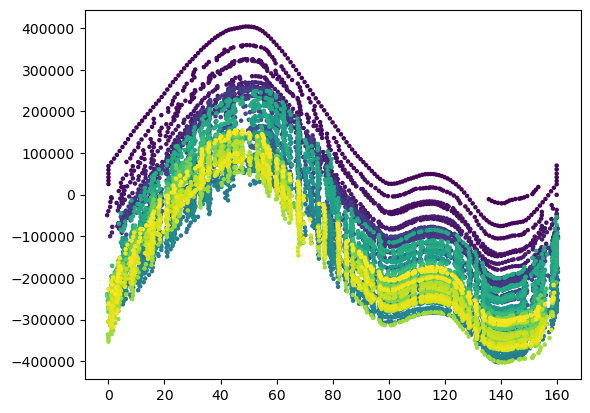

In [ ]:
plt.scatter(oog.phases, np.cumsum(frame_differences - np.mean(frame_differences[oog.sequence_manager.reference_indices[0]:oog.sequence_manager.reference_indices[1]])), s = 5, c = range(data.shape[0] - 1))

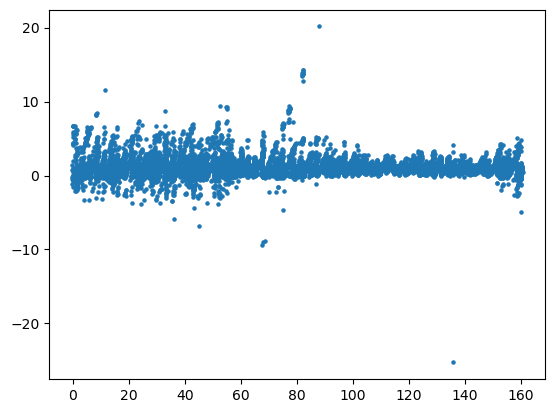

In [ ]:
plt.scatter(oog.phases[1::], oog.delta_phases, s = 5)

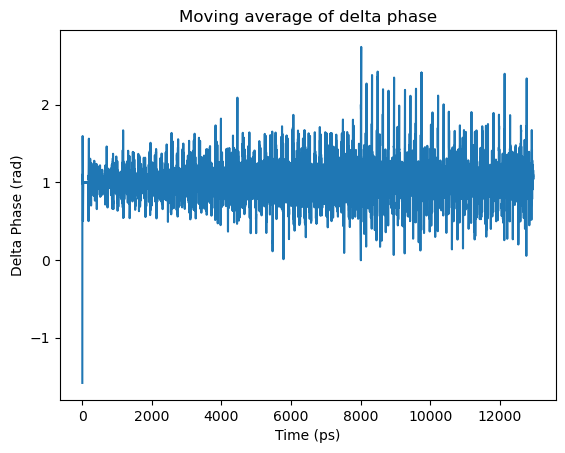

In [ ]:
# Plot moving average of oog.delta_phases
window = 10
delta_phases_moving_average = np.convolve(oog.delta_phases, np.ones(window)/window, mode='valid')

plt.plot(delta_phases_moving_average)
plt.xlabel("Time (ps)")
plt.ylabel("Delta Phase (rad)")
plt.title("Moving average of delta phase")
plt.show()

In [ ]:
delta_phases = oog.delta_phases - 1

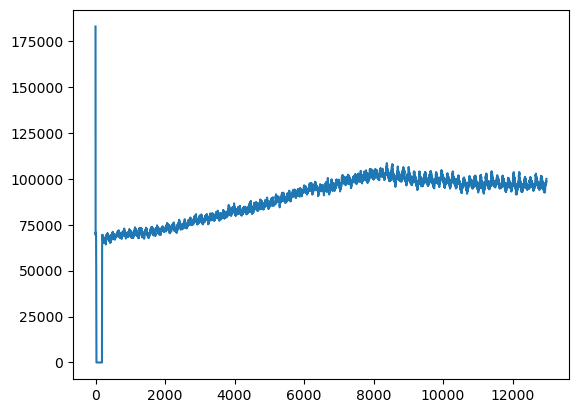

In [ ]:
plt.plot(np.min(oog.sads, axis = 1))

In [30]:
plt.plot(delta_phases[0:1000])

NameError: name 'delta_phases' is not defined

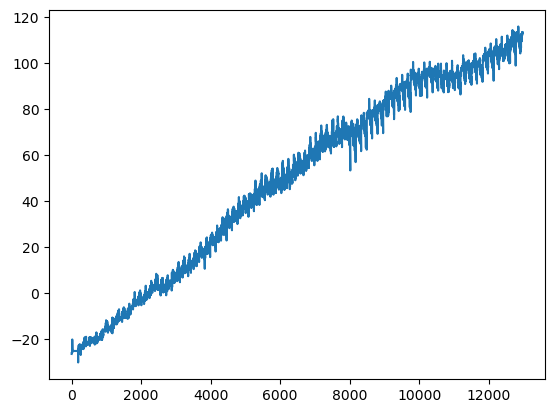

In [ ]:
plt.plot(np.cumsum(delta_phases))

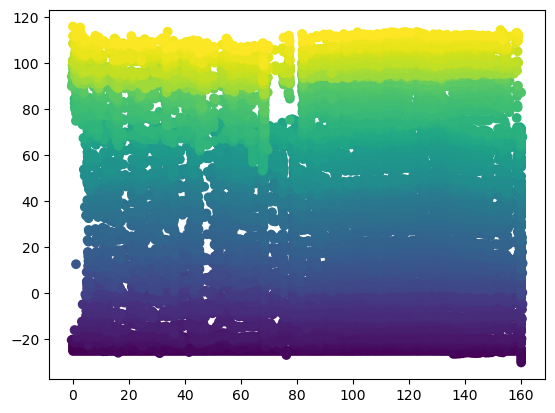

In [ ]:
plt.scatter(oog.phases[1::], np.cumsum(delta_phases), c = range(oog.phases.shape[0] - 1))